#  Abalone Age Prediction

## Phase 1: Data Preparation & Visualisation

# Table Content

1. Introduction\
•	Dataset Source\
•	Dataset Details\
•	Dataset Features\
•	Target Feature
2. Goals and Objectives
3. Data Cleaning and Preprocessing
4. Data Exploration and Visualisation
5. Summary and Conclusion
6. References


## Introduction

## Dataset Source

An Abalone dataset used in study was sourced from Kaggle (Warwick Nash,Tracy Sellers,Simon Talbot,Andrew Cawthorn,Wes Ford,1995). This dataset contains which contains information about the age of abalone

## Dataset Detail

This report examines the abalone dataset, which provides details about abalone age determination. Abalone age is typically determined by cutting the shell through the cone, staining it, and then counting the number of rings under a microscope. However, this method is laborious and time-consuming. The report suggests using alternative, easier-to-obtain measurements to predict abalone age. It also indicates that additional information, such as weather patterns and location (which influence food availability), may be necessary to address this challenge.

#### Dataset Retrieval

•	 We get this Dataset through Kaggle and loaded the dataset we will use throughout this report.

•	 We display 10 randomly sampled rows from this dataset.

In [2]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import io
import requests

pd.set_option('display.max_columns', None) 

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline 
%config InlineBackend.figure_format = 'retina'
plt.style.use("seaborn")

In [3]:
abalone_df = pd.read_csv("abalone.csv")
abalone_df.sample(10, random_state=999)

,Sex,Length,Diameter,Height,Whole weight,Shucked weight,Viscera weight,Shell weight,Rings
3259,M,0.640,0.505,0.165,1.4435,0.6145,0.3035,0.3900,18
3583,F,0.625,0.500,0.175,1.2730,0.5640,0.3020,0.3740,9
1932,F,0.620,0.495,0.170,1.0620,0.3720,0.2130,0.3400,11
3328,I,0.575,0.475,0.170,0.9670,0.3775,0.2840,0.2750,13
2426,I,0.565,0.435,0.155,0.7820,0.2715,0.1680,0.2850,14
2353,F,0.720,0.560,0.175,1.7265,0.6370,0.3415,0.5250,17
708,M,0.360,0.295,0.130,0.2765,0.0895,0.0570,0.1005,10
1168,M,0.620,0.450,0.200,0.8580,0.4285,0.1525,0.2405,8
120,F,0.470,0.365,0.105,0.4205,0.1630,0.1035,0.1400,9
2041,I,0.325,0.240,0.070,0.1520,0.0565,0.0305,0.0540,8


## Dataset Features

The features in our dataset are described in the table below. These descriptions are taken from the Kaggle data source.

In [4]:
from tabulate import tabulate

table = [['Sex', 'Nominal categorical', 'NA', 'M, F, I (infant)'],
         ['Length', 'Numeric', 'mm', 'Longest shell measurement'],
         ['Diameter', 'Numeric', 'mm', 'Perpendicular to length'],
         ['Height', 'Numeric', 'mm', 'With meat in shell'],
         ['Whole weight', 'Numeric', 'grams', 'Whole abalone'],
         ['Shucked weight', 'Numeric', 'grams', 'Weight of meat'],
         ['Viscera weight', 'Numeric', 'grams', 'Gut weight (after bleeding)'],
         ['Shell weight', 'Numeric', 'grams', 'After being dried'],
         ['Rings', 'Numeric', 'NA', 'Age + 1.5 years']]

print(tabulate(table, headers=['Name', 'Data Type', 'Units', 'Description'], tablefmt='fancy_grid'))


╒════════════════╤═════════════════════╤═════════╤═════════════════════════════╕
│ Name           │ Data Type           │ Units   │ Description                 │
╞════════════════╪═════════════════════╪═════════╪═════════════════════════════╡
│ Sex            │ Nominal categorical │ NA      │ M, F, I (infant)            │
├────────────────┼─────────────────────┼─────────┼─────────────────────────────┤
│ Length         │ Numeric             │ mm      │ Longest shell measurement   │
├────────────────┼─────────────────────┼─────────┼─────────────────────────────┤
│ Diameter       │ Numeric             │ mm      │ Perpendicular to length     │
├────────────────┼─────────────────────┼─────────┼─────────────────────────────┤
│ Height         │ Numeric             │ mm      │ With meat in shell          │
├────────────────┼─────────────────────┼─────────┼─────────────────────────────┤
│ Whole weight   │ Numeric             │ grams   │ Whole abalone               │
├────────────────┼──────────

## Target Feature

For this project, the target feature in this dataset will be the 'Rings', represents the age of abalone and is predicted based on the other features.

# Goal and Objectives

The goal of this project is to use machine learning techniques to predict the age of abalone based on physical measurements, such as sex, length, diameter, height, and various weights. This approach aims to replace the traditional and labor-intensive method of determining abalone age, which involves staining the shell and counting rings under a microscope.
The objective of the exploratory data analysis (EDA) for the abalone dataset was to understand its structure and relationships between variables. This included describing basic properties, exploring the target variable ('Rings'), visualizing relationships with other features, identifying correlations, analyzing categorical variables, and considering feature engineering possibilities. The goal was to gain insights, address data quality issues, and inform subsequent modeling tasks.

# Data Cleaning and Preprocessing

In this section, we describe the data cleaning and preprocessing steps undertaken for this project.

## Data Cleaning Steps

1) Drop irrelevant features in our dataset\
2) Check, rename and modify some column names\
3) Check for missing values\
4) Remove all the rows with missing values\
5) Random sampling of the dataset for 5000 rows

Let's first display all the columns in our dataset.

In [5]:
abalone_df.columns

Index(['Sex', 'Length', 'Diameter', 'Height', 'Whole weight', 'Shucked weight',
       'Viscera weight', 'Shell weight', 'Rings'],
      dtype='object')

Each column in the dataset is important for data analysis:

1. Sex: Indicates the gender of the abalone, with values 'M' for male, 'F' for female, and 'I' for infant.
2. Length: Represents the longest shell measurement of the abalone in millimeters.
3. Diameter: Indicates the diameter perpendicular to the length of the abalone in millimeters.
4. Height: Refers to the height of the abalone with the meat in the shell in millimeters.
5. Whole weight: Indicates the whole weight of the abalone in grams.
6. Shucked weight: Represents the weight of the meat of the abalone in grams.
7. Viscera weight: Indicates the gut weight (after bleeding) of the abalone in grams.
8. Shell weight: Represents the weight of the shell of the abalone (after being dried) in grams.
9. Rings: Represents the age of the abalone, calculated as the number of rings + 1.5 years

Columns are not labelled properly, which will be problematic when modelling. We will make all column names lower case and replace any spaces with underscores for consistency. We will also remove any white spaces before & after column names.

In [6]:
abalone_df.columns = abalone_df.columns.str.lower().str.strip()

columns_mapping = {
    'length': 'length',
    'diameter': 'diameter',
    'height': 'height',
    'whole weight': 'whole_weight',
    'shucked weight': 'shucked_weight',
    'viscera weight': 'viscera_weight',
    'shell weight': 'shell_weight',
    'rings': 'rings'
}

# Rename columns
abalone_df = abalone_df.rename(columns=columns_mapping)

In [7]:
abalone_df.sample(10, random_state=999)

,sex,length,diameter,height,whole_weight,shucked_weight,viscera_weight,shell_weight,rings
3259,M,0.640,0.505,0.165,1.4435,0.6145,0.3035,0.3900,18
3583,F,0.625,0.500,0.175,1.2730,0.5640,0.3020,0.3740,9
1932,F,0.620,0.495,0.170,1.0620,0.3720,0.2130,0.3400,11
3328,I,0.575,0.475,0.170,0.9670,0.3775,0.2840,0.2750,13
2426,I,0.565,0.435,0.155,0.7820,0.2715,0.1680,0.2850,14
2353,F,0.720,0.560,0.175,1.7265,0.6370,0.3415,0.5250,17
708,M,0.360,0.295,0.130,0.2765,0.0895,0.0570,0.1005,10
1168,M,0.620,0.450,0.200,0.8580,0.4285,0.1525,0.2405,8
120,F,0.470,0.365,0.105,0.4205,0.1630,0.1035,0.1400,9
2041,I,0.325,0.240,0.070,0.1520,0.0565,0.0305,0.0540,8


Next we check the data types and observe that they match the intended data types, thus no change is needed here.

In [8]:
# Check for Shape and data types
print(f"Shape of the dataset = {abalone_df.shape} \n")
print(f"Data types are below where 'object' indicates a string type: ")
print(abalone_df.dtypes)

Shape of the dataset = (4177, 9) 

Data types are below where 'object' indicates a string type: 
sex                object
length            float64
diameter          float64
height            float64
whole_weight      float64
shucked_weight    float64
viscera_weight    float64
shell_weight      float64
rings               int64
dtype: object


This summary gives an overview of the distribution of sexes (male, female, and infant) in the dataset, with males ('M') being the most common category.

In [9]:
from IPython.display import display, HTML
display(HTML('<b>Table 1: Summary of categorical features</b>'))
abalone_df.describe(include='object').T

,count,unique,top,freq
sex,4177,3,M,1528


To see all unique values for categorical data types

In [10]:
categoricalColumns = abalone_df.columns[abalone_df.dtypes==object].tolist()

for col in categoricalColumns:
    print('Unique values for ' + col)
    print(abalone_df[col].unique())
    print('')

Unique values for sex
['M' 'F' 'I']



The summary statistics are generated for all the numerical features. 

In [11]:
from IPython.display import display, HTML
display(HTML('<b>Table 2: Summary of numerical features</b>'))
abalone_df.describe(include=['int64','float64']).T

,count,mean,std,min,25%,50%,75%,max
length,4177.0,0.523992,0.120093,0.0750,0.4500,0.5450,0.615,0.8150
diameter,4177.0,0.407881,0.099240,0.0550,0.3500,0.4250,0.480,0.6500
height,4177.0,0.139516,0.041827,0.0000,0.1150,0.1400,0.165,1.1300
whole_weight,4177.0,0.828742,0.490389,0.0020,0.4415,0.7995,1.153,2.8255
shucked_weight,4177.0,0.359367,0.221963,0.0010,0.1860,0.3360,0.502,1.4880
viscera_weight,4177.0,0.180594,0.109614,0.0005,0.0935,0.1710,0.253,0.7600
shell_weight,4177.0,0.238831,0.139203,0.0015,0.1300,0.2340,0.329,1.0050
rings,4177.0,9.933684,3.224169,1.0000,8.0000,9.0000,11.000,29.0000


Missing values are checked by displaying the number of missing values in every column. We observe that They are zero missing values in thr dataset.So we dont need to change anything

In [12]:
missing_values = abalone_df.isnull().sum()
missing_values

sex               0
length            0
diameter          0
height            0
whole_weight      0
shucked_weight    0
viscera_weight    0
shell_weight      0
rings             0
dtype: int64

Finding any duplicate value contai in the dataset

In [13]:
abalone_df.duplicated().sum()

0

In [14]:
# Display a sample of the DataFrame
df=abalone_df.sample(500, random_state=0)
df

,sex,length,diameter,height,whole_weight,shucked_weight,viscera_weight,shell_weight,rings
668,M,0.550,0.425,0.155,0.9175,0.2775,0.2430,0.3350,13
1580,I,0.500,0.400,0.120,0.6160,0.2610,0.1430,0.1935,8
3784,M,0.620,0.480,0.155,1.2555,0.5270,0.3740,0.3175,11
463,I,0.220,0.165,0.055,0.0545,0.0215,0.0120,0.0200,5
2615,M,0.645,0.500,0.175,1.5105,0.6735,0.3755,0.3775,12
...,...,...,...,...,...,...,...,...,...
3475,I,0.400,0.315,0.085,0.2675,0.1160,0.0585,0.0765,6
704,M,0.400,0.300,0.125,0.4170,0.1910,0.0900,0.1175,9
1533,I,0.295,0.215,0.070,0.1210,0.0470,0.0155,0.0405,6
3328,I,0.575,0.475,0.170,0.9670,0.3775,0.2840,0.2750,13


In [15]:
df.head(10)

,sex,length,diameter,height,whole_weight,shucked_weight,viscera_weight,shell_weight,rings
668,M,0.550,0.425,0.155,0.9175,0.2775,0.2430,0.3350,13
1580,I,0.500,0.400,0.120,0.6160,0.2610,0.1430,0.1935,8
3784,M,0.620,0.480,0.155,1.2555,0.5270,0.3740,0.3175,11
463,I,0.220,0.165,0.055,0.0545,0.0215,0.0120,0.0200,5
2615,M,0.645,0.500,0.175,1.5105,0.6735,0.3755,0.3775,12
1399,F,0.650,0.505,0.165,1.1600,0.4785,0.2740,0.3490,11
2054,M,0.465,0.360,0.110,0.4955,0.2665,0.0850,0.1210,7
2058,M,0.485,0.390,0.135,0.6170,0.2500,0.1345,0.1635,8
217,I,0.405,0.300,0.120,0.3240,0.1265,0.0700,0.1100,7
1931,M,0.620,0.490,0.150,1.1950,0.4605,0.3020,0.3550,9


In [16]:
df.describe()

,length,diameter,height,whole_weight,shucked_weight,viscera_weight,shell_weight,rings
count,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000
mean,0.518510,0.403190,0.137490,0.800830,0.346520,0.176508,0.230796,9.848000
std,0.123522,0.102047,0.038987,0.486253,0.216273,0.110533,0.137523,3.238189
min,0.155000,0.110000,0.020000,0.015500,0.006500,0.003000,0.005000,3.000000
25%,0.455000,0.350000,0.110000,0.451750,0.181875,0.093125,0.125000,8.000000
50%,0.535000,0.420000,0.140000,0.765750,0.318500,0.160500,0.225000,9.000000
75%,0.611250,0.476250,0.165000,1.128750,0.480375,0.245625,0.325000,11.000000
max,0.770000,0.620000,0.235000,2.825500,1.146500,0.641500,0.897000,23.000000


The summary statistics of the sample may differ from the summary statistics of the original dataset.while checking the values are nearly same as original dataset.

# Data Exploration and Visualisation

Our dataset is now considered to be clean and we are ready to start visualising and explore each of the features.

## Univariate Visualisation

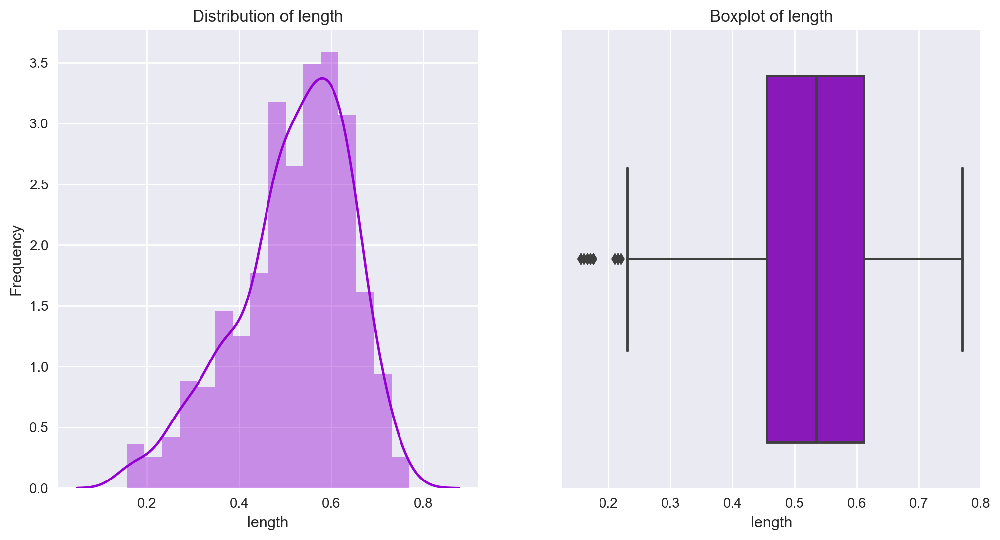

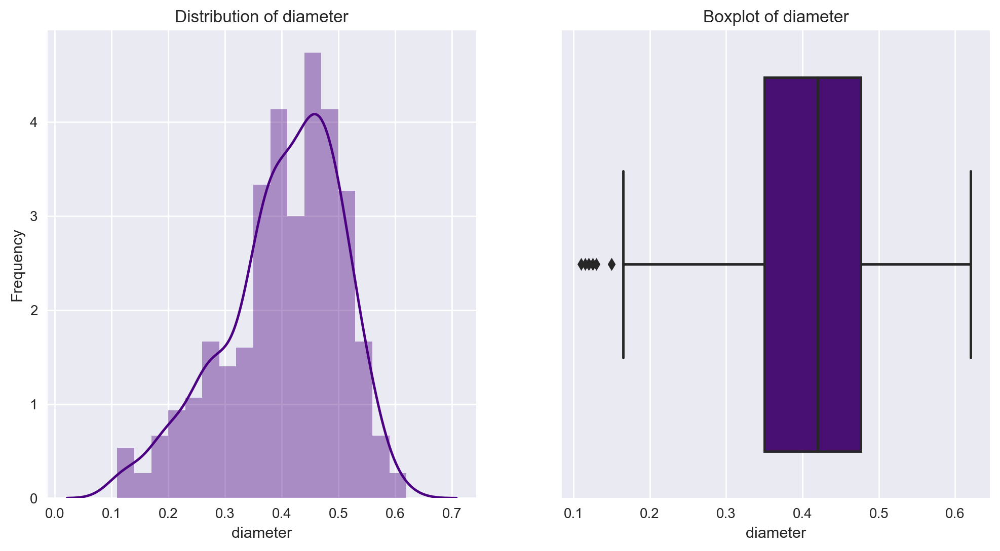

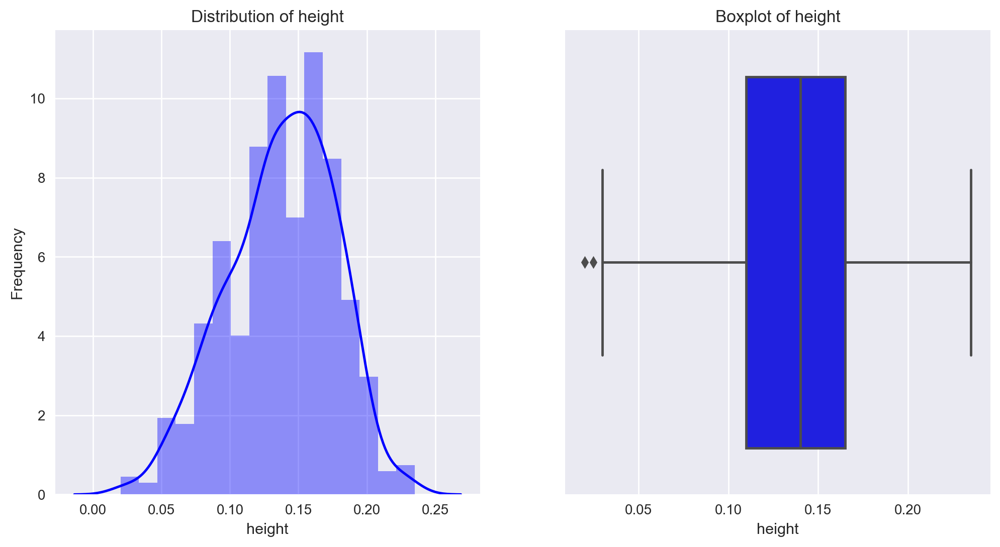

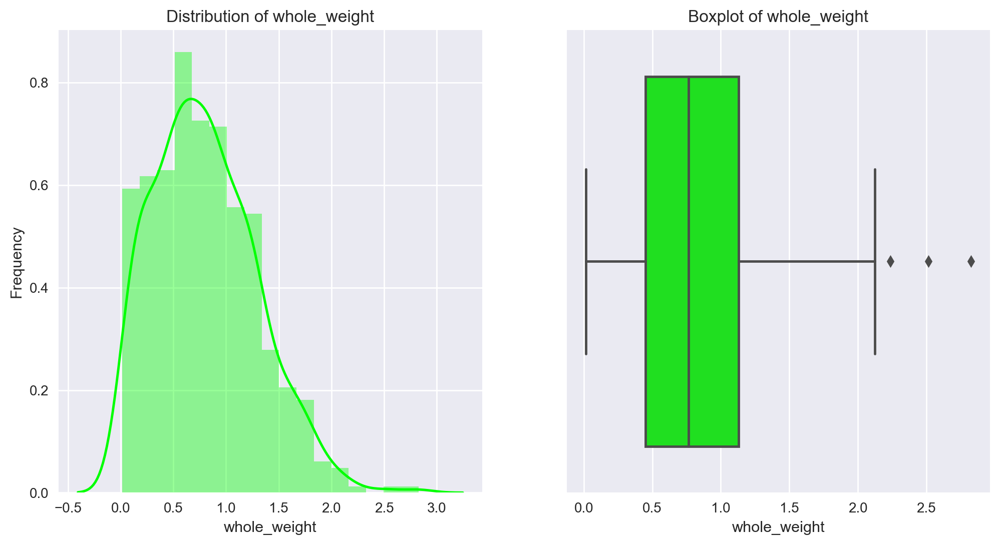

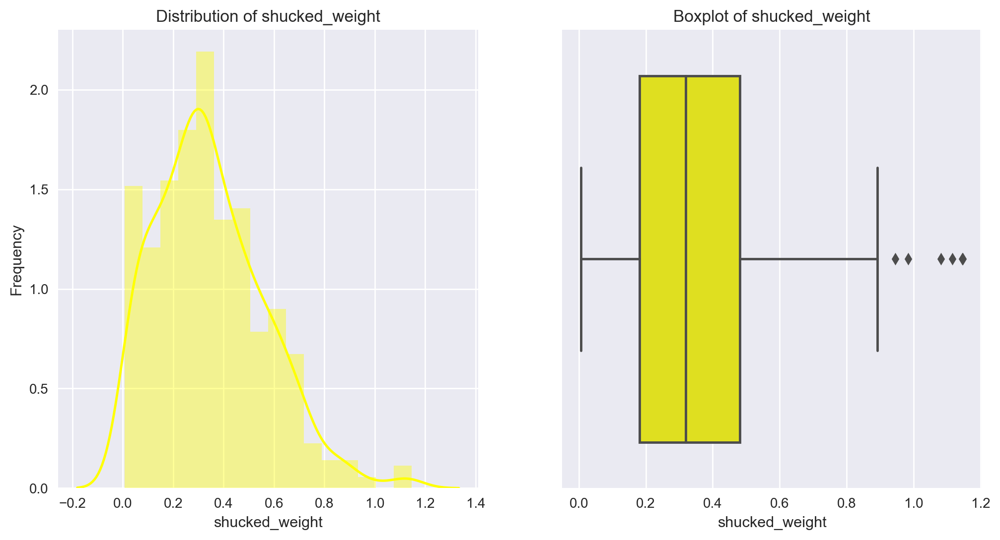

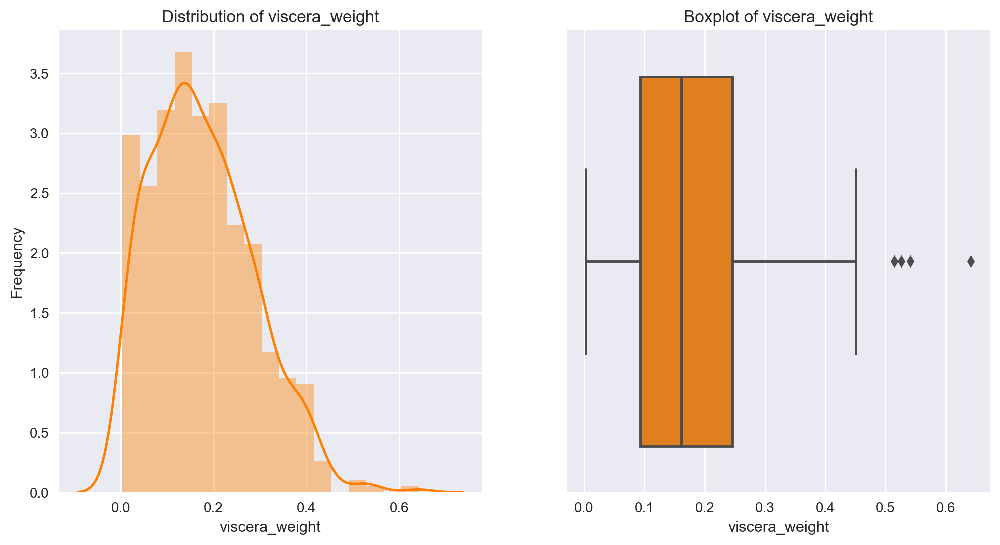

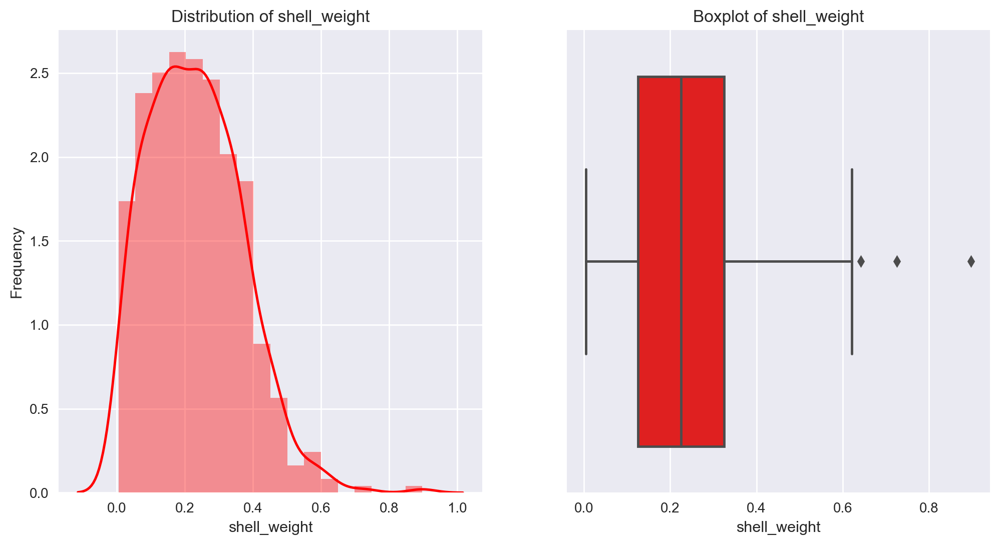

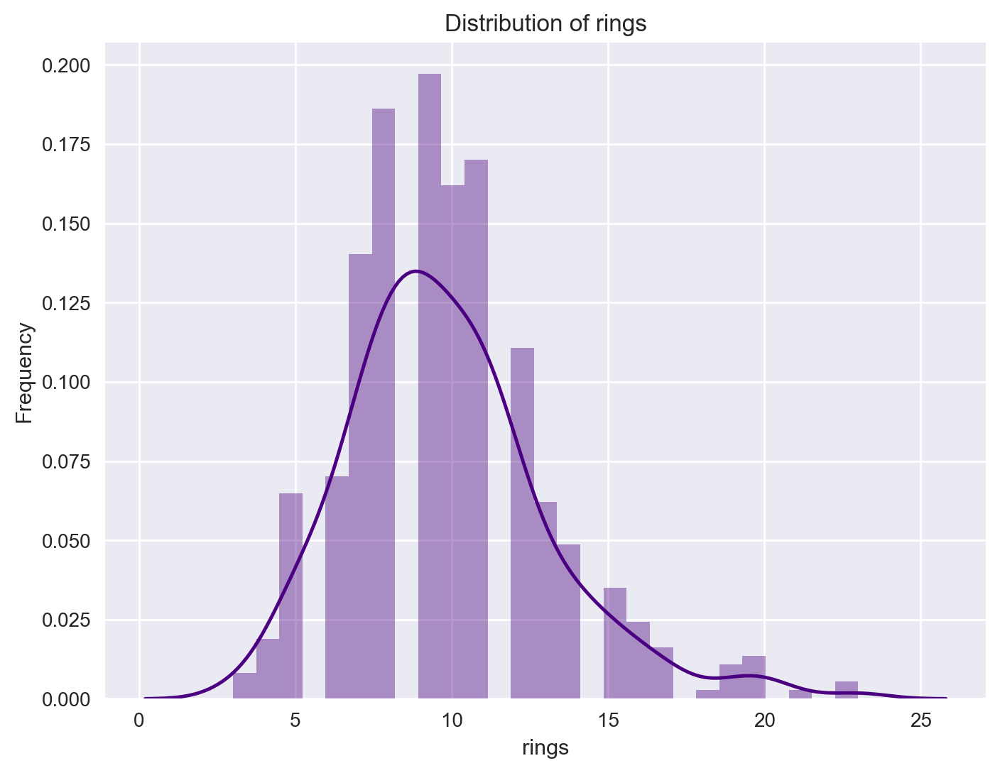

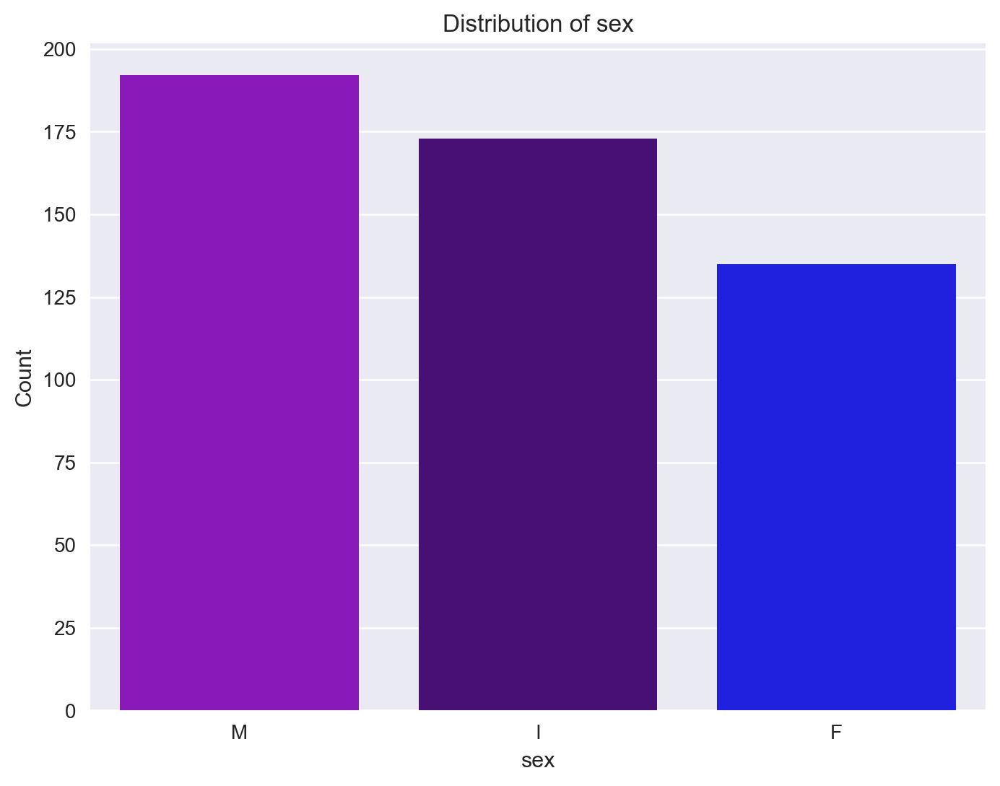

In [17]:
numerical_variables = ['length', 'diameter', 'height', 'whole_weight', 'shucked_weight', 'viscera_weight', 'shell_weight']
target_variable = 'rings'
categorical_variables = ['sex']

# Define VIBGYOR colors
vibgyor_colors = ['#9400D3', '#4B0082', '#0000FF', '#00FF00', '#FFFF00', '#FF7F00', '#FF0000']

# Univariate plots for numerical variables (histograms and boxplots)
for i, var in enumerate(numerical_variables):
    # Histogram
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    sns.distplot(df[var], kde=True, color=vibgyor_colors[i])
    plt.title(f'Distribution of {var}')
    plt.xlabel(var)
    plt.ylabel('Frequency')

    # Boxplot
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df[var], color=vibgyor_colors[i])
    plt.title(f'Boxplot of {var}')
    plt.xlabel(var)
    plt.show()

# Univariate plot for the target variable
plt.figure(figsize=(8, 6))
sns.distplot(df[target_variable], kde=True, color='indigo')
plt.title(f'Distribution of {target_variable}')
plt.xlabel(target_variable)
plt.ylabel('Frequency')
plt.show()

# Univariate plot for the categorical variable
for i, var in enumerate(categorical_variables):
    plt.figure(figsize=(8, 6))
    sns.countplot(x=var, data=df, palette=vibgyor_colors)
    plt.title(f'Distribution of {var}')
    plt.xlabel(var)
    plt.ylabel('Count')
    plt.show()


The two graphs in the image depict the distribution of length,diameter,whole weight,shucked weight, viscera weight and shell weight  data. The graph on the left is a histogram, which shows the frequency of occurrence of each feature of dataset.The graph on the right is a boxplot, which explains InterquatileRange and outlier of the dataset. The x-axis represents the features of the dataset and the y-axis represents the frequency. The height of each bar in the histogram corresponds to the number of data points that fall within a specific range of lengths.The graph on the right is a box plot, which summarizes the distribution of the data by showing the following five values:

Minimum value, 
First quartile (Q1) - the value below which lie 25% of the data points, 
Median (Q2) - the middle value, 
Third quartile (Q3) - the value below which lie 75% of the data points, 
Maximum value 

By analyzing the graphs, we can determine that the length, diameter, and height features are left-skewed and contain outliers, while the whole weight, shucked weight, viscera weight, and shell weight features are right-skewed and also contain outliers.And Male Abalone is higher number when compared to other gender category.

## Bivariate Visualization 

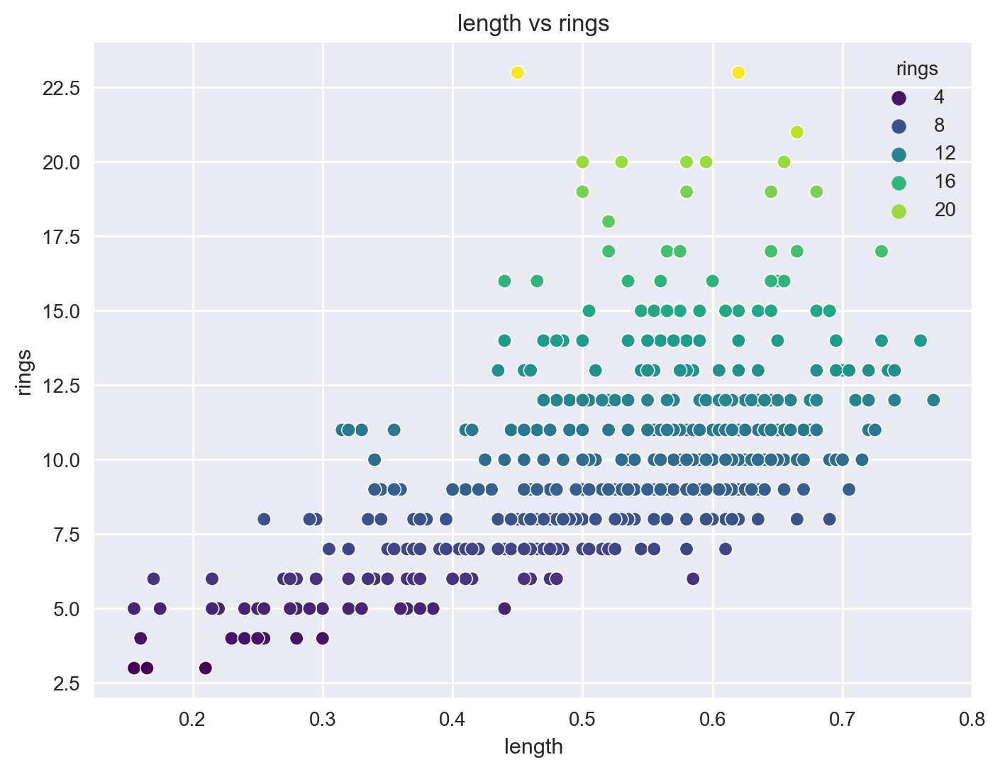

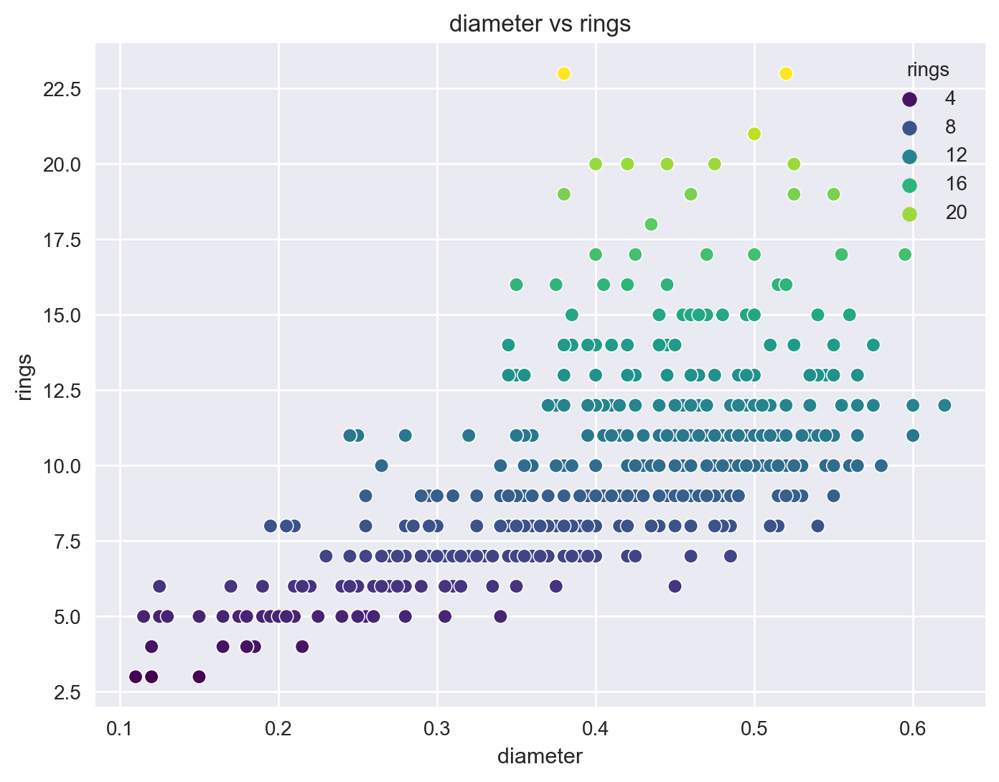

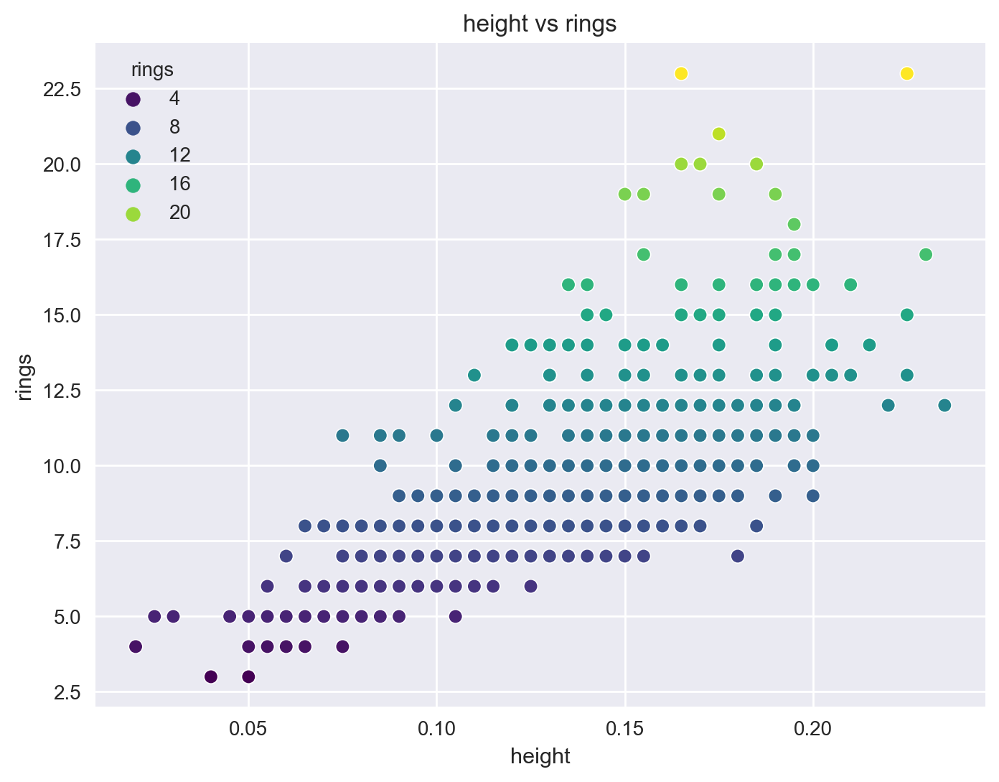

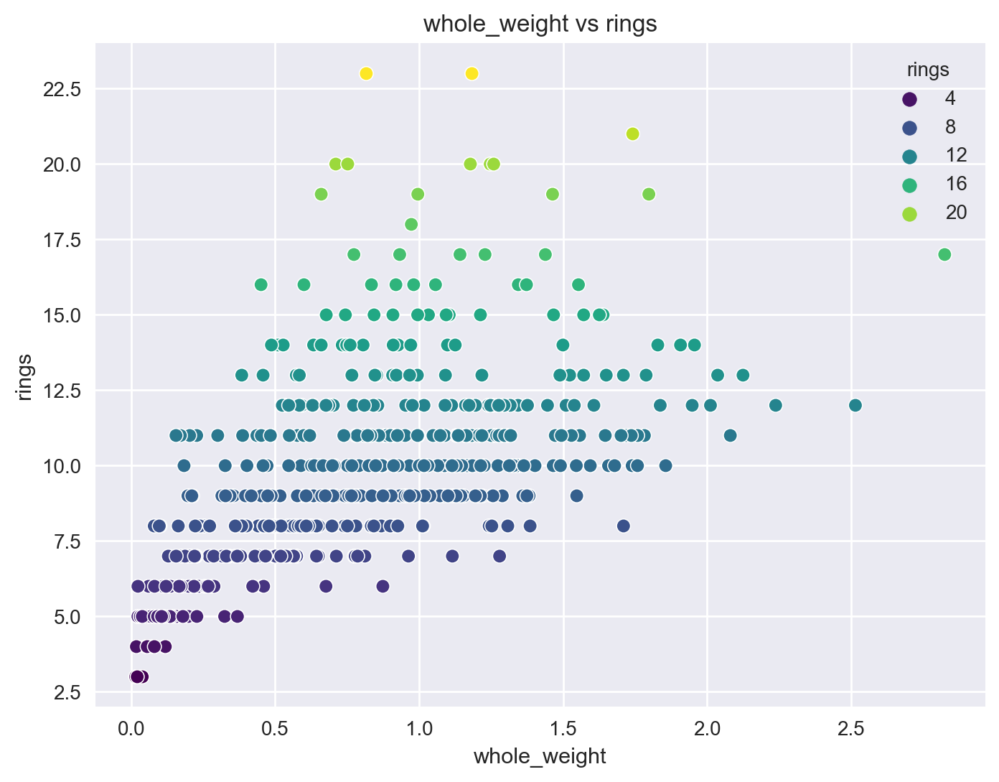

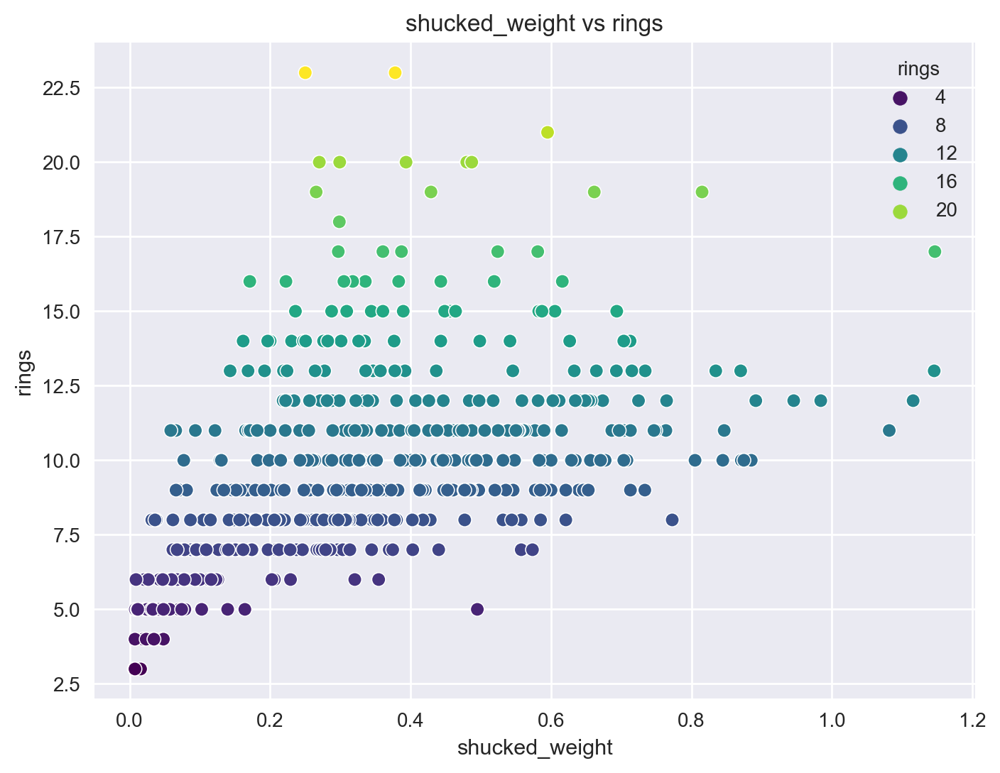

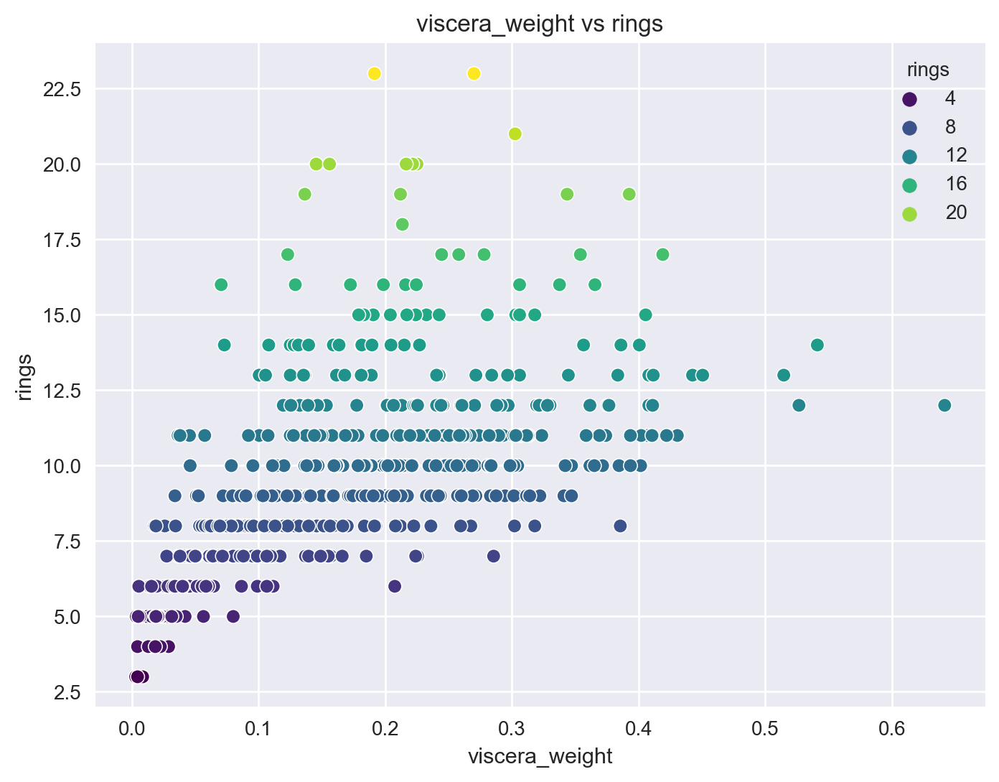

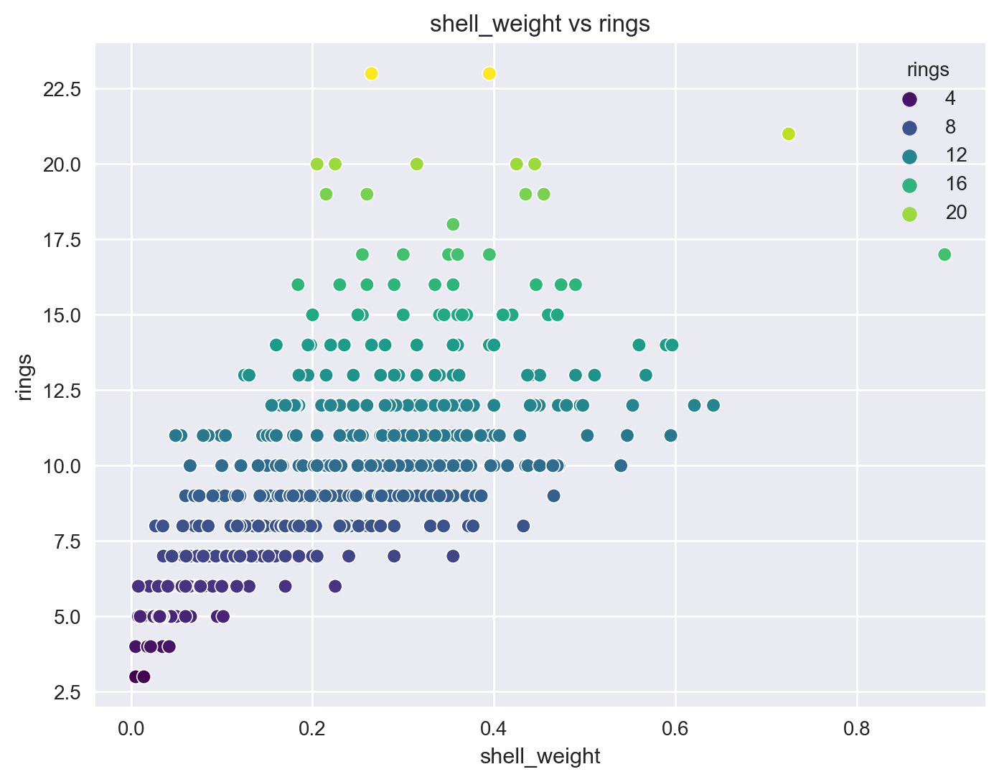

<Figure size 1200x1000 with 0 Axes>

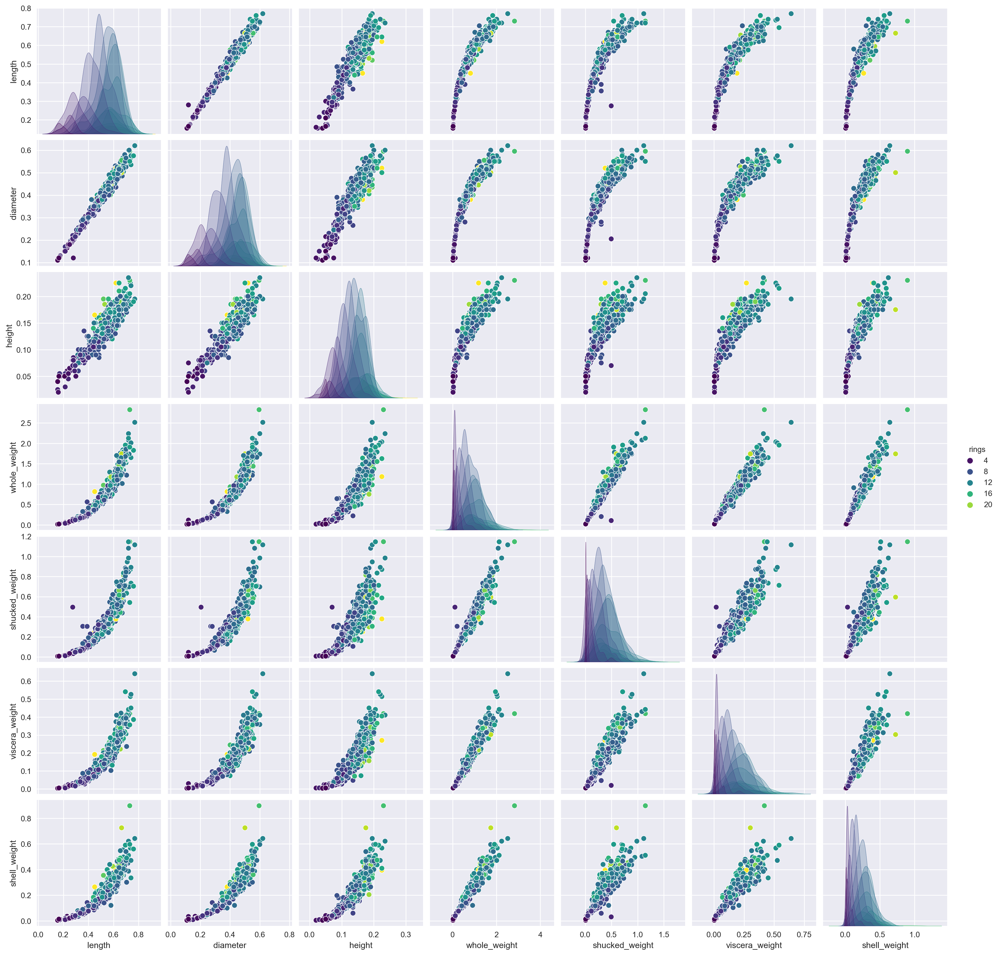

In [18]:
numerical_variables = ['length', 'diameter', 'height', 'whole_weight', 'shucked_weight', 'viscera_weight', 'shell_weight']
target_variable = 'rings'
categorical_variables = ['sex']

# Bivariate plots for numerical variables vs. target variable
for var in numerical_variables:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=df[var], y=df[target_variable], hue=df[target_variable], palette='viridis')
    plt.title(f'{var} vs {target_variable}')
    plt.xlabel(var)
    plt.ylabel(target_variable)
    plt.show()

# Bivariate plot for numerical variables and target variable
plt.figure(figsize=(12, 10))
sns.pairplot(df[numerical_variables + [target_variable]], hue=target_variable, palette='viridis')
plt.show()

•	In bivariate analysis, when observing the length, height, and diameter of the abalone, we can infer that they       have the highest percentage of rings. \
•	Additionally, the shucked weight and viscera weight contribute to the percentage of rings, but to a lesser         extent. \
•	Overall, using the features length, height, and diameter allows for a more accurate identification of the           percentage of rings in an abalone.

## Multivariate Visualization 

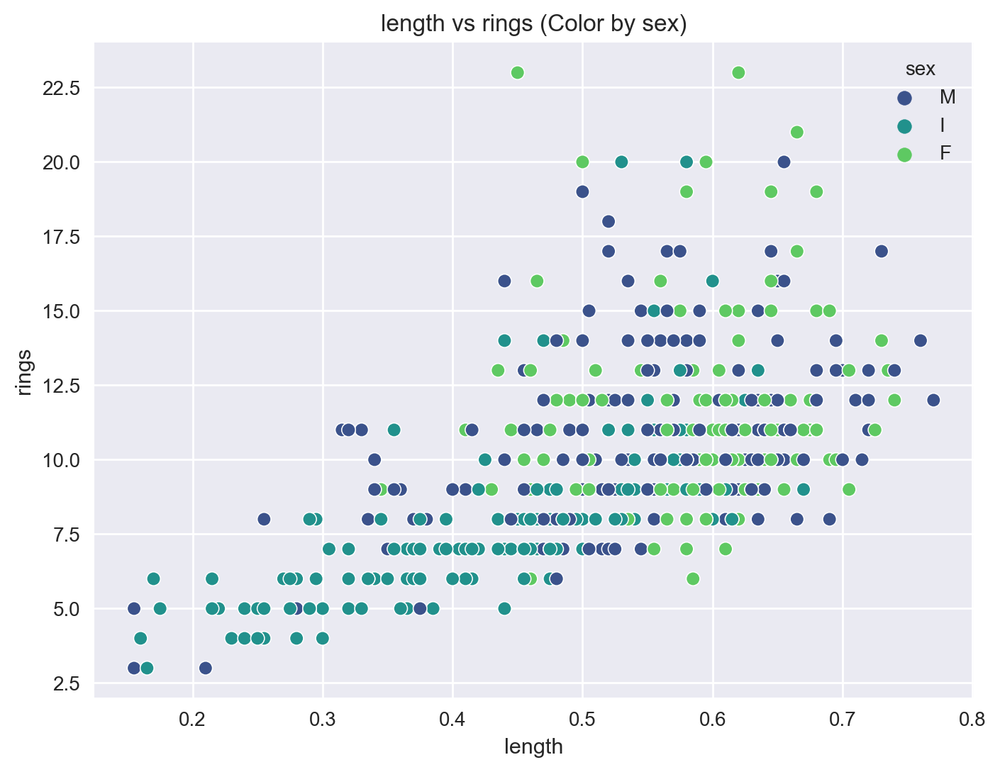

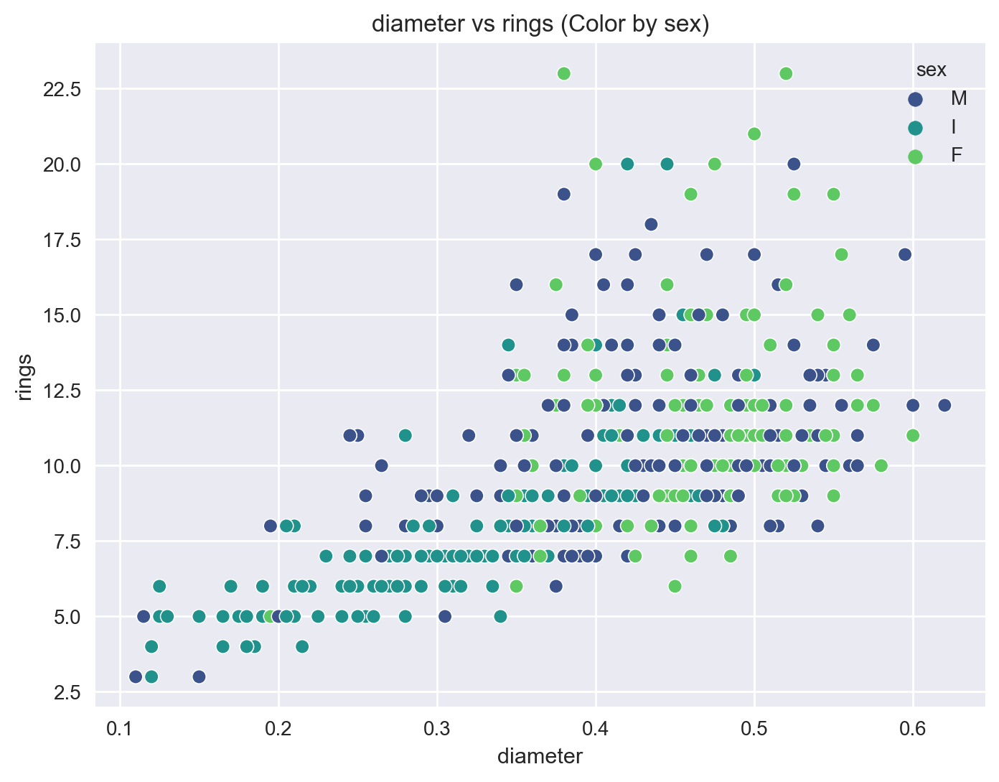

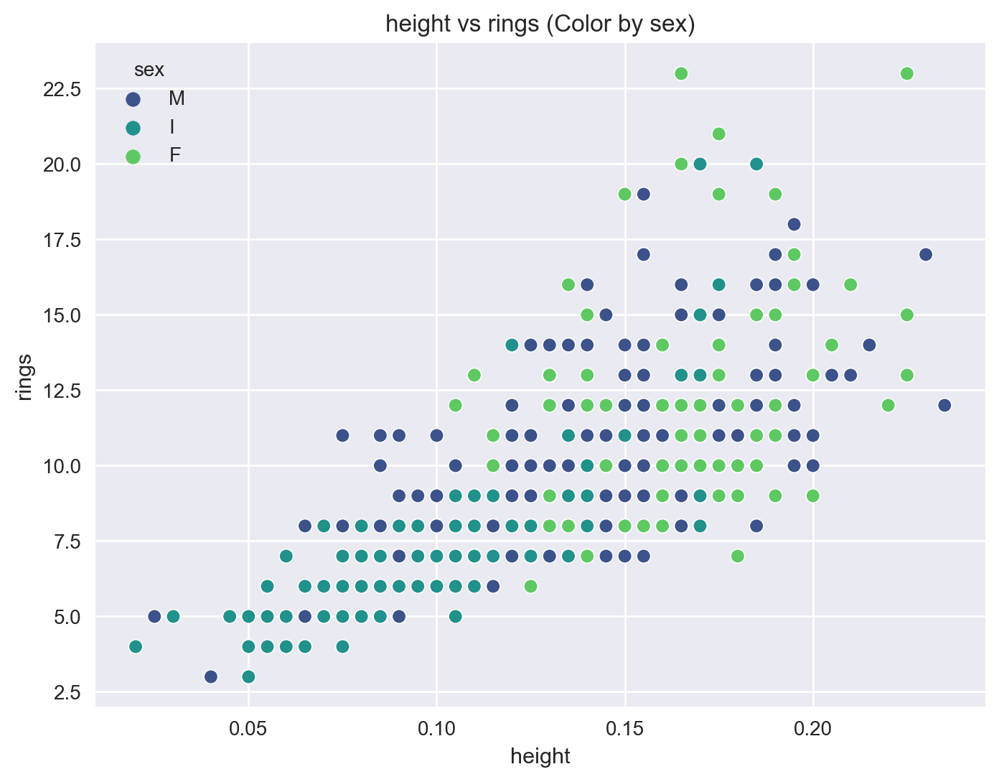

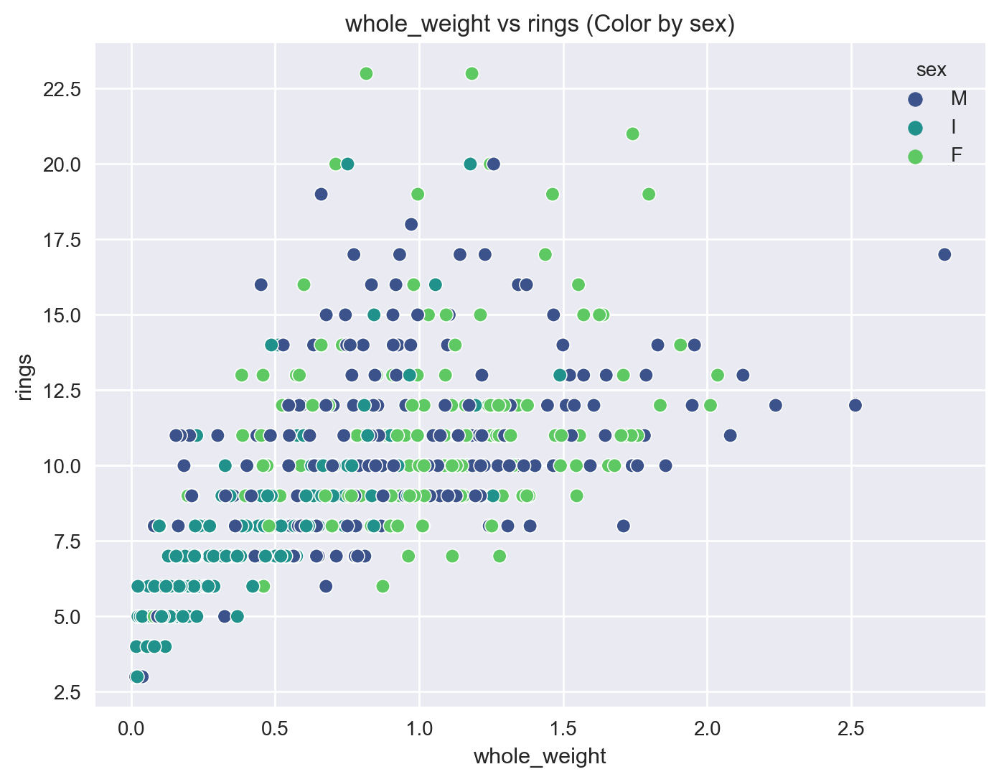

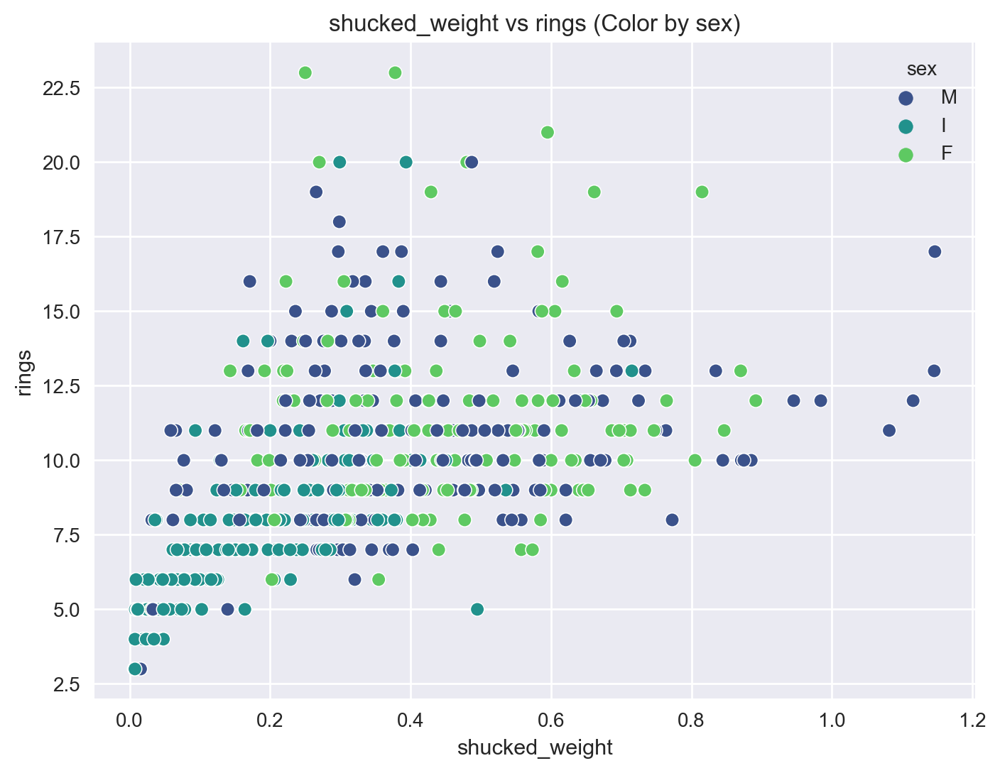

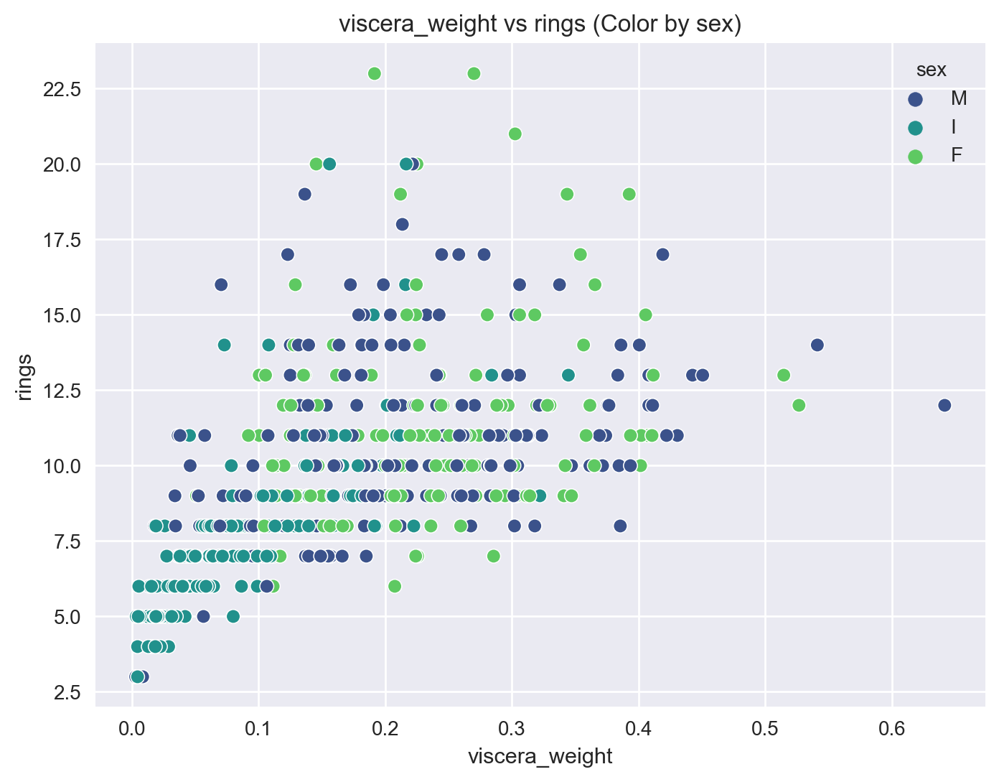

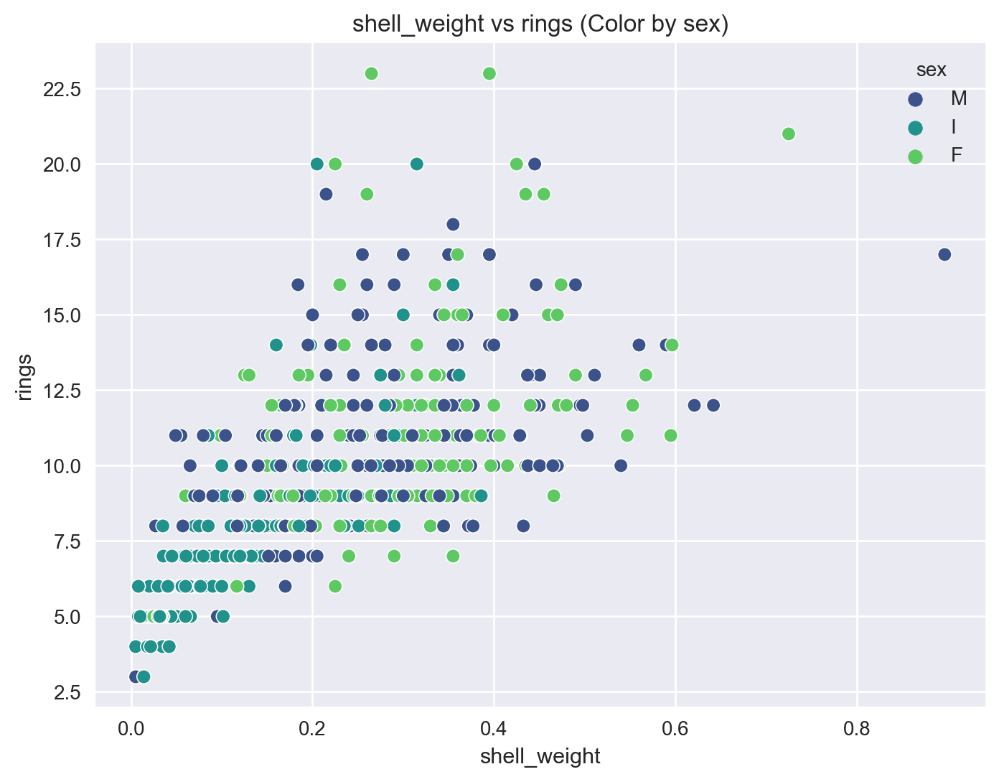

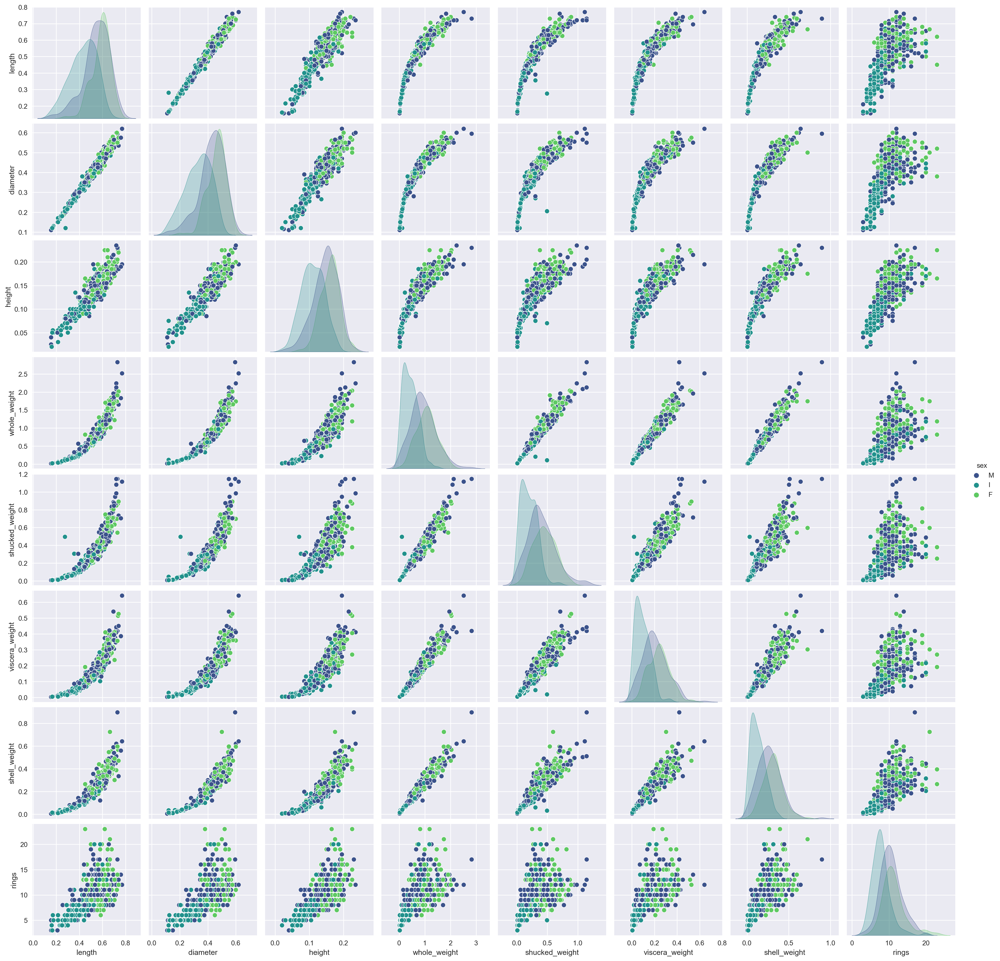

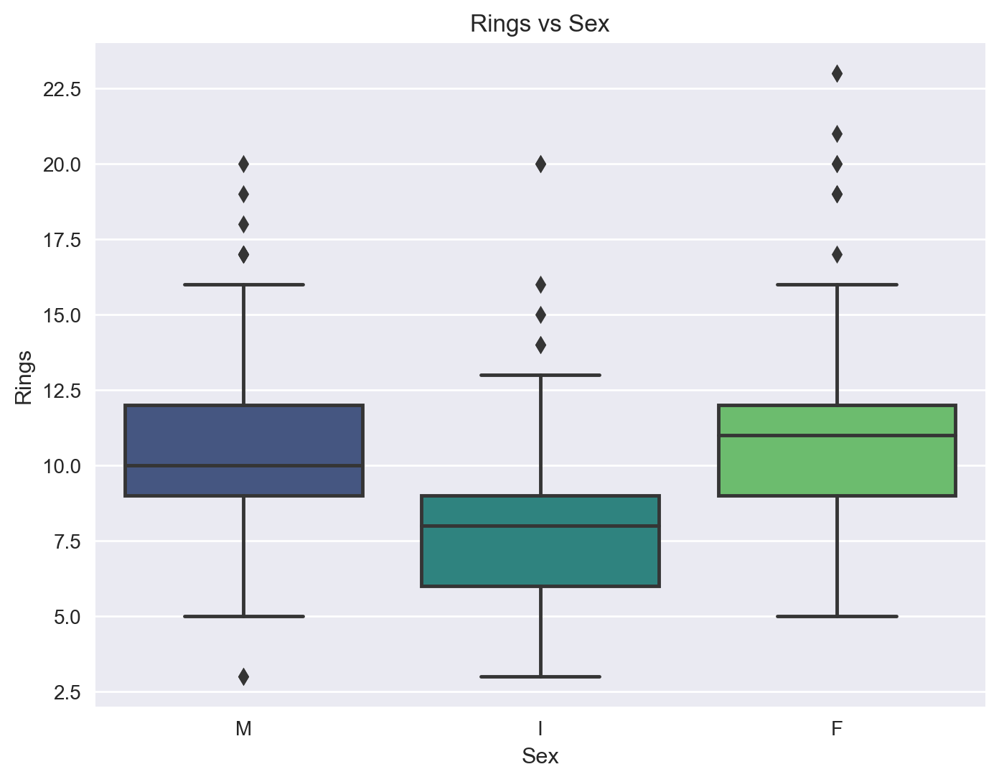

In [19]:
numerical_variables = ['length', 'diameter', 'height', 'whole_weight', 'shucked_weight', 'viscera_weight', 'shell_weight']
target_variable = 'rings'
categorical_variables = ['sex']

# Scatter plot with color for the third variable
for num_var in numerical_variables:
    for cat_var in categorical_variables:
        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=num_var, y=target_variable, hue=cat_var, data=df, palette='viridis')
        plt.title(f'{num_var} vs {target_variable} (Color by {cat_var})')
        plt.xlabel(num_var)
        plt.ylabel(target_variable)
        plt.show()

# Pair plot with hue for the third variable
sns.pairplot(df, hue='sex', palette='viridis')
plt.show()

# Boxplot for 'rings' and 'sex'
plt.figure(figsize=(8, 6))
sns.boxplot(x='sex', y='rings', data=df, palette='viridis')
plt.title('Rings vs Sex')
plt.xlabel('Sex')
plt.ylabel('Rings')
plt.show()


•	In multivariate visualization, when comparing sex with all other features in the dataset, we conclude that         female abalones have a slightly higher percentage of rings compared to other gender categories in an abalone.

# Summary and Conclusions

Summary:

In Phase I of this project, we undertook the tasks of data cleaning & preprocessing and data visualization. We cleaned the dataset, processed it, and took a sample to further analyze and visualize the data. This initial phase was crucial in preparing the dataset for deeper analysis and identifying key trends and relationships. Moving forward, we will delve deeper into the dataset to explore more complex patterns and insights that can inform our understanding of abalone age prediction.

Analysis of the dataset revealed that the length, diameter, and height features are left-skewed and contain outliers. Conversely, the whole weight, shucked weight, viscera weight, and shell weight features are right-skewed and also contain outliers.
In bivariate analysis, it was observed that the length, height, and diameter of the abalone have the highest correlation with the percentage of rings. The shucked weight and viscera weight features also contribute to the percentage of rings, but to a lesser extent.
Male abalones were found to be the most prevalent gender category in the dataset.
Multivariate visualization indicated that female abalones have a slightly higher percentage of rings compared to other gender categories.

Conclusion:

The analysis suggests that the length, diameter, and height of an abalone are strong indicators of the percentage of rings, with female abalones showing a slightly higher percentage compared to other gender categories. The dataset contains outliers in various features, which should be considered during further analysis. Understanding these relationships can aid in the accurate prediction of the age of an abalone based on its physical characteristics.

# Reference

1. Abalone: https://en.wikipedia.org/wiki/Abalone
2. Hossain, M, & Chowdhury, N Econometric Ways to Estimate the Age and Price of 
Abalone. Department of Economics, University of Nevada (2019).
3. UCI Machine Learning Repository, Abalone dataset: 
https://archive.ics.uci.edu/ml/datasets/Abalone
4. A.B.Karthick Anand Babu, Design and Development of Artificial Neural Network Based 
Tamil Unicode Symbols Identification System. IJCSI International Journal of Computer 
Science Issues, Vol. 9, Issue 1, No 2, (2012).
5. Alsabti, K., Ranka, S., & Singh, V CLOUDS: A decision tree classifier for large datasets 
(1999).
6. K. Jabeen ve K. Ahamed, "Abalone Age Prediction using Artificial Neural Network," 
IOSR Journal of Computer Engineering, vol. 18, no. 05, pp. 34–38, (2016).
7. Misman, M. F., Samah, A. A., Ab Aziz, N. A., Majid, H. A., Shah, Z. A., Hashim, H., & 
Harun, M. F. (2019, September). Prediction of Abalone Age Using Regression-Based Neural 
Network. In 2019 1st International Conference on Artificial Intelligence and Data Sciences 
(AiDAS) (pp. 23-28). IEEE.
8. Sahin, E., Saul, C. J., Ozsarfati, E., & Yilmaz, A. Abalone Life Phase Classification with 
Deep Learning. In 2018 5th International Conference on Soft Computing & Machine 
Intelligence (ISCMI), pp. 163-167 (2018).
9. UCI Machine Learning Repository, Abalone dataset: 
https://archive.ics.uci.edu/ml/datasets/Abalone
10. Bhatia, N. Survey of nearest neighbor techniques. arXiv preprint arXiv:1007.0085 
(2010).
11. Kerber R ChiMerge: discretization of numeric attributes. In: Proceedings of the tenth 
national conference on artificial intelligence (1992)